### Examples in Gravitation

The following is a few examples showing how to use Python to solve various problems in gravitation.

#### Example - Finding altitude and impact speed for satellite

A satellite performs uniform circular motion around the Earth.
The satellite has a speed that is half of the escape velocity.




>a) What is the speed of the satellite?

>b) What is the altitude of the satellite?

The satellite is suddenly stopped completely in an impact with another satellite, and falls directly down to Earth. 

>c) What is the impact speed when the satellite crashes with the Earth?



Determine the escape velocity.

We set up the equation for conservation of mechanical energy for a point on the surface of the Earth and infinity.
At infinity the system has no potenial and no kinetic energy.
The equations are symbolic and again we use sympy. 

In [1]:
from sympy import symbols,Eq,Rational,solve
G,M,m,R,h,v_escape,v = symbols('G,M,m,R,h,v_escape,v')
eq = Eq(Rational(1,2)*m*v_escape**2-G*M*m/R,0)
print('Equation for escape velocity')
display(eq)
sol = solve(eq,v_escape)
v_escape = sol[1]
print('Expression for escape velocity')
display(v_escape)

Equation for escape velocity


Eq(-G*M*m/R + m*v_escape**2/2, 0)

Expression for escape velocity


sqrt(2)*sqrt(G*M/R)

Determine the speed of the satellite.

In [2]:
v = v_escape / 2
print('Expression for speed of satellite')
display(v)

Expression for speed of satellite


sqrt(2)*sqrt(G*M/R)/2

Determine the altitude.

We set up Newton's second law of motion with the unknown altitude, where we have inserted the found expression for the speed.

In [3]:
print('Equation for altitude')
eq = Eq(m*v**2/(R+h),G*M*m/(R+h)**2)
display(eq)
sol = solve(eq,h)
h = sol[0]
print('Expression for altitude')
display(h)

Equation for altitude


Eq(G*M*m/(2*R*(R + h)), G*M*m/(R + h)**2)

Expression for altitude


R

Determine the impact speed.

We set up an equation for conservation of energy for the point just af the impact with another satellite, and just
before impact with the Earth.

In [4]:
v = symbols('v')
print('Equation for free fall')
eq = Eq(-G*M*m/(R+h),-G*M*m/R+Rational(1,2)*m*v**2)
display(eq)
sol = solve(eq,v)
v = sol[1]
print('Expression for impact speed')
display(v)

Equation for free fall


Eq(-G*M*m/(2*R), -G*M*m/R + m*v**2/2)

Expression for impact speed


sqrt(G*M/R)

#### Example - Simulation of satellite motion
The Earth has mass $M=5.97\cdot10^{24}\text{ kg}$ and radius $R=6370\text{ km}$.
The gravitational constant is $G=6.67\cdot10^{-11}\text{ N}\cdot\text{m}^2/\text{kg}^2$.

Consider a satellite moving around the Earth. 
The initial conditions are $x=2R, y=0\text{ m}, v_x=0\text{ m/s}, v_y=7000\text{ m/s}$.
Simulate a full orbit around the Earth, plot the orbit and the Earth, and determine the period.

The equations of motion for the satellite is
$$\frac{dx}{dt}=v_x$$
$$\frac{dy}{dt}=v_y$$
$$m\frac{dv_x}{dt}=-\frac{GMmx}{\left(x^2+y^2\right)^{3/2}}$$
$$m\frac{dv_y}{dt}=-\frac{GMmy}{\left(x^2+y^2\right)^{3/2}}$$
The model can be programmed like
```python
def f(t,z):
    x,y,vx,vy = z
    dxdt = vx
    dydt = vy
    dvxdt = -G*M*x/(x**2+y**2)**1.5
    dvydt = -G*M*y/(x**2+y**2)**1.5
    return [dxdt,dydt,dvxdt,dvydt]```
```
The initial condition can be written as
```python
y0 = [2.0*R,0.0,0.0,7000.0]
```

To determine the period we use an event that triggers after one revolution around the Earth.
Here we have $y=0$.
```python
def hit(T,z):
    x,y,vx,vy = z
    return y
hit.terminal = True
hit.direction = 1
```
This event will unfortunately trigger immediately, so we shift the $y$ initial value a very small amount.
Then the event will be triggered at the desired point.
```python
y0 = [2.0*R,0.00001,0.0,7000.0]
```

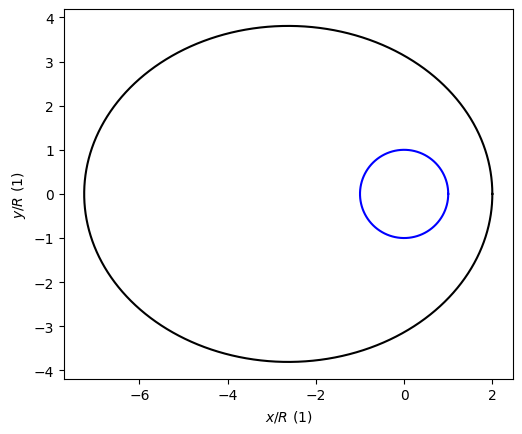

The period is 50375.47 s
The period is 839.59 min
The period is 13.99 h


In [5]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
G = 6.67e-11
M = 5.97e24
R= 6370.e3
def f(t,z):
    x,y,vx,vy = z
    dxdt = vx
    dydt = vy
    dvxdt = -G*M*x/(x**2+y**2)**1.5
    dvydt = -G*M*y/(x**2+y**2)**1.5
    return [dxdt,dydt,dvxdt,dvydt]
def hit(T,z):
    x,y,vx,vy = z
    return y
hit.terminal = True
hit.direction = 1
t_eval = np.linspace(0,60000,10000)
t_span = [t_eval[0],t_eval[-1]]
y0 = [2.0*R,0.00001,0.0,7000.0]
sol = solve_ivp(f,t_span=t_span,y0=y0,t_eval=t_eval,events=[hit],atol=1e-8,rtol=1e-8)
plt.figure()
t = np.linspace(0,2*np.pi,100)
plt.plot(np.cos(t),np.sin(t),'b-')
plt.plot(sol.y[0]/R,sol.y[1]/R,'k-')
plt.xlabel('$x/R$ (1)')
plt.ylabel('$y/R$ (1)')
plt.axis('scaled')
plt.show()
print('The period is {:.2f} s'.format(sol.t_events[0][0]))
print('The period is {:.2f} min'.format(sol.t_events[0][0]/60))
print('The period is {:.2f} h'.format(sol.t_events[0][0]/60/60))


#### Example - Animation of orbit
This animation takes around a minute to generate.
Note how the $x$ and $y$ solutions are far from sinusoidal, and note
how the satellite moves faster closer to Earth, and slower further away from Earth.

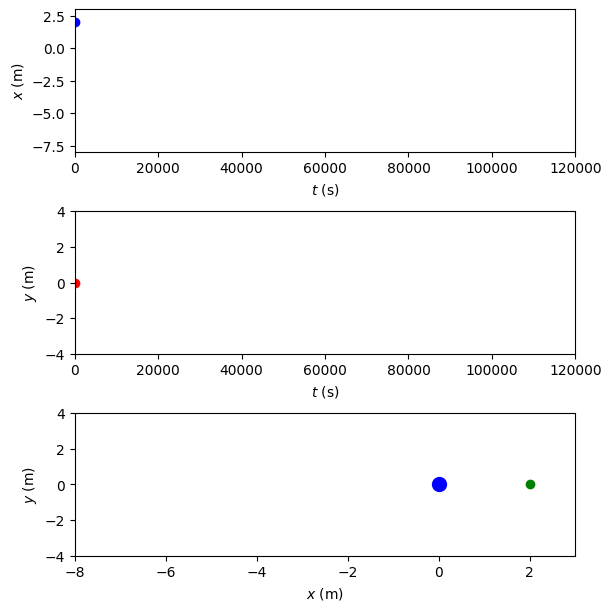

In [6]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import matplotlib.animation
G = 6.67e-11
M = 5.97e24
R= 6370.e3
def f(t,z):
    x,y,vx,vy = z
    dxdt = vx
    dydt = vy
    dvxdt = -G*M*x/(x**2+y**2)**1.5
    dvydt = -G*M*y/(x**2+y**2)**1.5
    return [dxdt,dydt,dvxdt,dvydt]
def hit(T,z):
    x,y,vx,vy = z
    return y
hit.terminal = True
hit.direction = 1
t_eval = np.linspace(0,120000,200)
t_span = [t_eval[0],t_eval[-1]]
y0 = [2.0*R,0.00001,0.0,7000.0]
sol = solve_ivp(f,t_span=t_span,t_eval=t_eval,y0=y0,events=[],atol=1e-8,rtol=1e-8)
t = sol.t
x = sol.y[0]
y = sol.y[1]
N = np.size(sol.t)
fig,ax = plt.subplots(3,1,figsize=(6,6),layout='constrained')
def animate(i):
    plt.subplot(311)
    plt.cla()
    plt.xlabel('$t$ (s)')
    plt.ylabel('$x$ (m)')
    plt.xlim(t[0],t[-1])
    plt.ylim(-8,3)
    plt.plot(t[0:i+1],x[0:i+1]/R,'b-',linewidth = 0.2)
    plt.plot(t[i],x[i]/R,'bo')
    plt.subplot(312)
    plt.cla()
    plt.xlabel('$t$ (s)')
    plt.ylabel('$y$ (m)')
    plt.xlim(t[0],t[-1])
    plt.ylim(-4,4)
    plt.plot(t[0:i],y[0:i]/R,'r-',linewidth = 0.2)
    plt.plot(t[i],y[i]/R,'ro')
    plt.subplot(313)
    plt.cla()
    plt.xlabel('$x$ (m)')
    plt.ylabel('$y$ (m)')
    plt.xlim(-8,3)
    plt.ylim(-4,4)
    plt.plot(x[0:i]/R,y[0:i]/R,'g-',linewidth = 0.2)
    plt.plot(x[i]/R,y[i]/R,'go')
    plt.plot([0],[0],'bo',markersize=10)
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=N, interval=100)
f = "ddd.gif" 
writergif = matplotlib.animation.PillowWriter(fps=30) 
#ani.save(f, writer=writergif)
from IPython.display import HTML
HTML(ani.to_jshtml())